In [58]:
## FOM  Analysis

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy.interpolate import interp1d

In [59]:
%%HTML
<style>
    body {
        --vscode-font-family: "ComicSansMS"
    }
</style>

## Assumptions 
1. Vdd = 1.8V 
2. Vout_LDO = 1.2V
3. W/L unit = 1u/0.18u
4. M_scale = 1000

In [60]:
C_L = 100e-12  # Load Capacitance in Farads
PSRR_dB = -40  # Power Supply Rejection Ratio in dB
I_max = 10e-3  # Maximum Current in Amperes
beta = 100/(100+1)  # Beta ratio
PSRR = 10 ** (PSRR_dB / 20)  # Convert PSRR from dB to linear scale
I_q = 0.05*I_max  # Quiescent Current in Amperes

In [61]:
param_master = pd.read_csv("ldo_pmos_kgm_char_Msweep_10mA.csv")

In [62]:
kgm_p = np.abs(param_master['kgmp Y'])
kcsg_p = np.abs(param_master['kcgs Y'])
kcgd_p = np.abs(param_master['kcgd Y'])
kgds_p = np.abs(param_master['kgds Y'])
ids = np.abs(param_master['ids Y'])
M_scale = np.abs(param_master['kgmp X']) 
vd = np.abs(param_master['vd Y'])

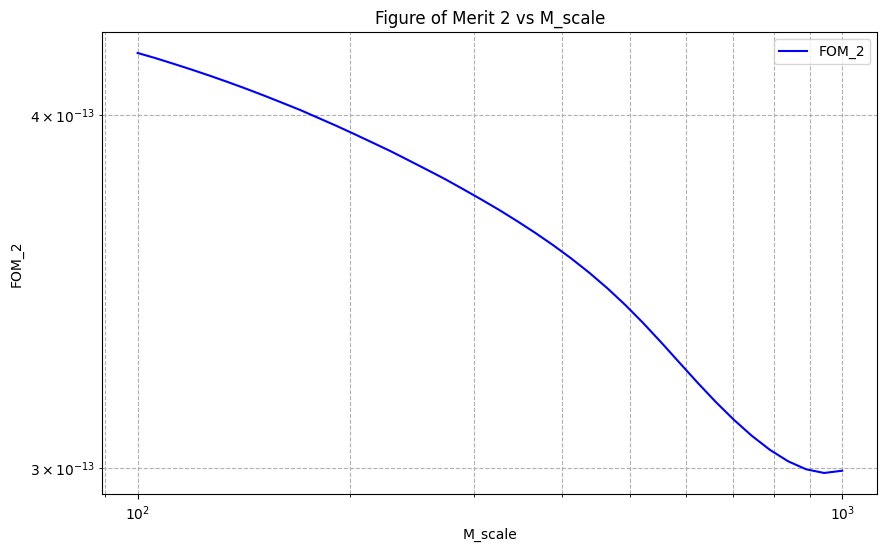

In [63]:
# Assuming PSRR, C_L, I_max, k_gm_pass, k_Cgs, beta, and I_q are already defined
FOM_2 = (
    PSRR *
    ((C_L / I_max) / kgm_p + (kcsg_p / kgm_p) * ((beta + 1) / beta)) *
    (beta / (beta + 1)) *
    (I_q / I_max)
)

plt.figure(figsize=(10, 6))
plt.loglog(M_scale, FOM_2, label='FOM_2', color='blue')
plt.xlabel('M_scale')
plt.ylabel('FOM_2')
plt.title('Figure of Merit 2 vs M_scale')
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

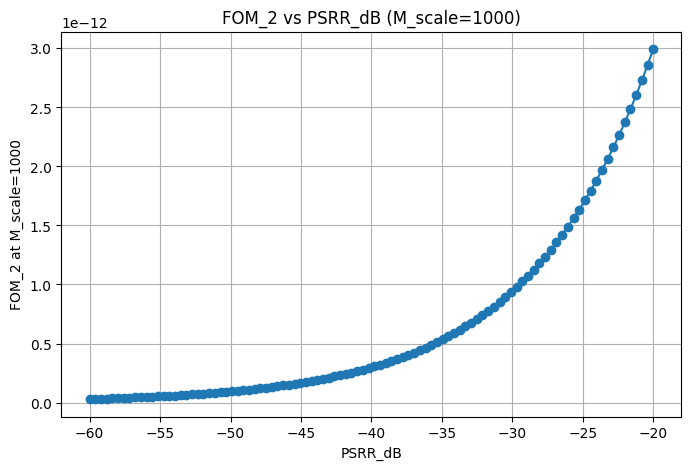

In [64]:
PSRR_dB_range = np.linspace(-60, -20, 100)
FOM_sweep = []

for psrr_db in PSRR_dB_range:
    psrr_linear = 10 ** (psrr_db / 20)
    fom = (
        psrr_linear *
        ((C_L / I_max) / kgm_p + (kcsg_p / kgm_p) * ((beta + 1) / beta)) *
        (beta / (beta + 1)) *
        (I_q / I_max)
    )
    fom_value = fom[M_scale == 1000].values[0]
    FOM_sweep.append(fom_value)

plt.figure(figsize=(8, 5))
plt.plot(PSRR_dB_range, FOM_sweep, marker='o')
plt.xlabel('PSRR_dB')
plt.ylabel('FOM_2 at M_scale=1000')
plt.title('FOM_2 vs PSRR_dB (M_scale=1000)')
plt.grid(True)
plt.show()

## Using C/ID to estimate I_q

In [65]:
I_load = 10e-3
I_res_div = (1/100) * I_load
pmos_pass_char_csv = 'ldo_pmos_kgm_char_Msweep_10mA.csv'
V_out = 1.2
V_ctrl = 0.9
f_bw = 1e6
C_load = 100e-12
PSRR_target_dB = -40
PM_target = 60
kgm_max = 25
I_budget = (5/100) * I_load  # 5% of I_load

In [66]:
csv_file_pmos = 'ldo_pmos_kgm_char_Msweep_10mA.csv'
csv_file_nmos = "sf_nmos_char_vg_1_3.csv"

Resistor Divider Resistance (R_res_div) for 1% current overhead at I_max: 12000.00 Ohms
Total current through the PMOS pass transistor (I_total): 10.10 mA
Gate-Drain Capacitance (Cgd) at I_total 10.10 mA: 0.390 pF
Gate-Source Capacitance (Cgs) at I_total 10.10 mA: 0.958 pF
Effective Load Resistance (R_L_eff) considering Rds: 287.09 Ohms
Effective Load Capacitance at I_min: 100.406 pF
Load Resistance (R_L) required for bandwidth target 1000000.0 Hz: 1585.12 Ohms
Using Resistor Divider Resistance (R_res_div): 12000.00 Ohms
Av_pass at I_total 10.10 mA: 24.53 V/V
Stage 2 required current (I_req_stage2): 0.9504 mA
Stage 2 input capacitance (C_in_stage2): 907.60 pF
Stage 1 required current (I_req_stage1): 210.7142 mA
Total required current (I_req_total): 211.6646 mA
LDO Power and Pass Parameters Estimation:
C_in_pass: 1.0916659361100337e-11
Av_pass: 24.533791468811994
k_res_div: 0.75
details_pass: {'idx_both': 37, 'M_scale_both': 888.6238, 'gm_p_both': 0.08545695121176254, 'gds_p_both': 0.00

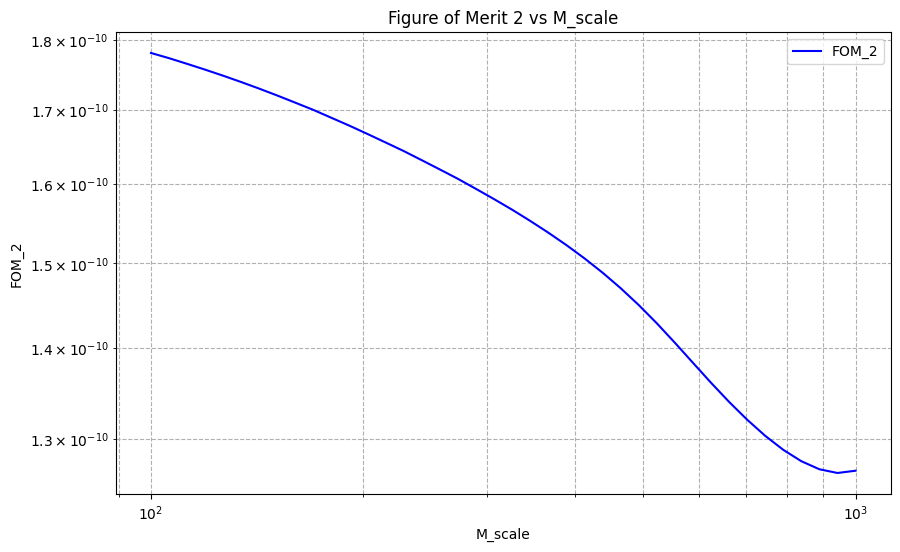

In [67]:
C_L = C_load  # Load Capacitance in Farads
PSRR_dB = PSRR_target_dB  # Power Supply Rejection Ratio in dB
I_max = I_load  # Maximum Current in Amperes
beta = I_load/(I_load+I_res_div)  # Beta ratio
PSRR = 10 ** (PSRR_dB / 20)  # Convert PSRR from dB to linear scale

## Estimating I_q using functions defined 
from LDO_functions import estimate_ldo_power_and_pass_params

result_ldo = estimate_ldo_power_and_pass_params(
    PSRR_target_dB=PSRR_target_dB,
    f_bw=f_bw,
    PM_target=PM_target,
    I_load=I_load,
    I_res_div=I_res_div,
    V_out=V_out,
    V_ctrl=V_ctrl,
    C_out=C_L,
    csv_file_nmos=csv_file_nmos,
    csv_file_pmos=csv_file_pmos,
    kgm_target=kgm_max
)

print("LDO Power and Pass Parameters Estimation:")
for key, value in result_ldo.items():
    print(f"{key}: {value}")

I_q = result_ldo['I_total']  # Quiescent Current in Amperes

# Assuming PSRR, C_L, I_max, k_gm_pass, k_Cgs, beta, and I_q are already defined
FOM_2 = (
    PSRR *
    ((C_L / I_max) / kgm_p + (kcsg_p / kgm_p) * ((beta + 1) / beta)) *
    (beta / (beta + 1)) *
    (I_q / I_max)
)

plt.figure(figsize=(10, 6))
plt.loglog(M_scale, FOM_2, label='FOM_2', color='blue')
plt.xlabel('M_scale')
plt.ylabel('FOM_2')
plt.title('Figure of Merit 2 vs M_scale')
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

Resistor Divider Resistance (R_res_div) for 1% current overhead at I_max: 12000.00 Ohms
Total current through the PMOS pass transistor (I_total): 10.10 mA
Gate-Drain Capacitance (Cgd) at I_total 10.10 mA: 0.390 pF
Gate-Source Capacitance (Cgs) at I_total 10.10 mA: 0.958 pF
Effective Load Resistance (R_L_eff) considering Rds: 287.09 Ohms
Effective Load Capacitance at I_min: 100.406 pF
Load Resistance (R_L) required for bandwidth target 1000000.0 Hz: 1585.12 Ohms
Using Resistor Divider Resistance (R_res_div): 12000.00 Ohms
Av_pass at I_total 10.10 mA: 24.53 V/V
Stage 2 required current (I_req_stage2): 28.5252 mA
Stage 2 input capacitance (C_in_stage2): 5.58 pF
Stage 1 required current (I_req_stage1): 388.8996 mA
Total required current (I_req_total): 417.4248 mA
Resistor Divider Resistance (R_res_div) for 1% current overhead at I_max: 12000.00 Ohms
Total current through the PMOS pass transistor (I_total): 10.10 mA
Gate-Drain Capacitance (Cgd) at I_total 10.10 mA: 0.390 pF
Gate-Source Capa

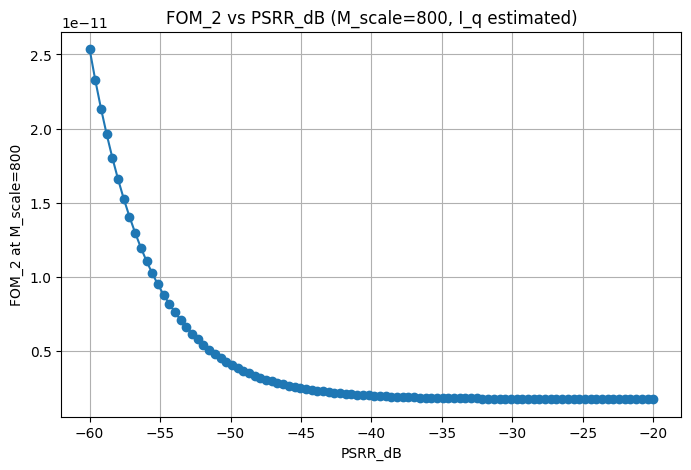

In [68]:
# Interpolate kgm_p, kcsg_p, and M_scale to get values at Mscale = 800
Mscale_target = 800

kgm_p_800 = np.interp(Mscale_target, M_scale, kgm_p)
kcsg_p_800 = np.interp(Mscale_target, M_scale, kcsg_p)



# Sweep PSRR_dB and calculate FoM for each value
PSRR_dB_range = np.linspace(-60, -20, 100)
FoM_800 = []

for psrr_db in PSRR_dB_range:
    psrr_linear = 10 ** (psrr_db / 20)
    beta_800 = I_load / (I_load + I_res_div)

    # Use the predefined function to estimate I_q for Mscale = 800
    result_ldo_800 = estimate_ldo_power_and_pass_params(
    PSRR_target_dB=psrr_db,  # This will be swept below
    f_bw=f_bw,
    PM_target=PM_target,
    I_load=I_load,
    I_res_div=I_res_div,
    V_out=V_out,
    V_ctrl=V_ctrl,
    C_out=C_L,
    csv_file_nmos=csv_file_nmos,
    csv_file_pmos=csv_file_pmos,
    kgm_target=kgm_p_800
    )
    I_q_800 = result_ldo_800['I_total']

    fom_val = (
        psrr_linear *
        ((C_L / I_load) / kgm_p_800 + (kcsg_p_800 / kgm_p_800) * ((beta_800 + 1) / beta_800)) *
        (beta_800 / (beta_800 + 1)) *
        (I_q_800 / I_load)
    )
    FoM_800.append(fom_val)

plt.figure(figsize=(8, 5))
plt.plot(PSRR_dB_range, FoM_800, marker='o')
plt.xlabel('PSRR_dB')
plt.ylabel('FOM_2 at M_scale=800')
plt.title('FOM_2 vs PSRR_dB (M_scale=800, I_q estimated)')
plt.grid(True)
plt.show()

Resistor Divider Resistance (R_res_div) for 1% current overhead at I_max: 12000.00 Ohms
Total current through the PMOS pass transistor (I_total): 10.10 mA
Gate-Drain Capacitance (Cgd) at I_total 10.10 mA: 0.390 pF
Gate-Source Capacitance (Cgs) at I_total 10.10 mA: 0.958 pF
Effective Load Resistance (R_L_eff) considering Rds: 287.09 Ohms
Effective Load Capacitance at I_min: 100.406 pF
Load Resistance (R_L) required for bandwidth target 1000000.0 Hz: 1585.12 Ohms
Using Resistor Divider Resistance (R_res_div): 12000.00 Ohms
Av_pass at I_total 10.10 mA: 24.53 V/V
Stage 2 required current (I_req_stage2): 39.9228 mA
Stage 2 input capacitance (C_in_stage2): 7.81 pF
Stage 1 required current (I_req_stage1): 761.7659 mA
Total required current (I_req_total): 801.6886 mA
Resistor Divider Resistance (R_res_div) for 1% current overhead at I_max: 12000.00 Ohms
Total current through the PMOS pass transistor (I_total): 10.10 mA
Gate-Drain Capacitance (Cgd) at I_total 10.10 mA: 0.390 pF
Gate-Source Capa

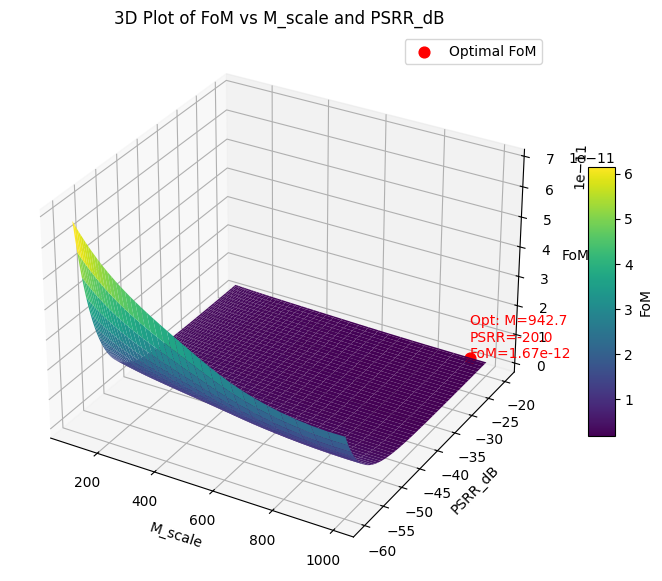

In [69]:
from mpl_toolkits.mplot3d import Axes3D

# Prepare meshgrid for M_scale and PSRR_dB_range
Mscale_vals = M_scale.values
PSRR_vals = PSRR_dB_range
M_grid, PSRR_grid = np.meshgrid(Mscale_vals, PSRR_vals)

# Calculate FoM for each combination
FoM_grid = np.zeros_like(M_grid)
for i, psrr_db in enumerate(PSRR_vals):
    psrr_linear = 10 ** (psrr_db / 20)
    # Use I_q from previous calculation (constant for each M_scale)
    for j, m in enumerate(Mscale_vals):
        kgm = np.interp(m, M_scale, kgm_p)
        kcsg = np.interp(m, M_scale, kcsg_p)
        beta_val = I_load / (I_load + I_res_div)
        # Estimate I_q for each (psrr_db, m) using the function
        kgm_val = kgm
        kcsg_val = kcsg
        result = estimate_ldo_power_and_pass_params(
            PSRR_target_dB=psrr_db,
            f_bw=f_bw,
            PM_target=PM_target,
            I_load=I_load,
            I_res_div=I_res_div,
            V_out=V_out,
            V_ctrl=V_ctrl,
            C_out=C_L,
            csv_file_nmos=csv_file_nmos,
            csv_file_pmos=csv_file_pmos,
            kgm_target=kgm_val
        )
        I_q_val = result['I_total']
        fom_val = (
            psrr_linear *
            ((C_L / I_load) / kgm_val + (kcsg_val / kgm_val) * ((beta_val + 1) / beta_val)) *
            (beta_val / (beta_val + 1)) *
            (I_q_val / I_load)
        )
        FoM_grid[i, j] = fom_val

# Plotting
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(M_grid, PSRR_grid, FoM_grid, cmap='viridis', edgecolor='none')
ax.set_xlabel('M_scale')
ax.set_ylabel('PSRR_dB')
ax.set_zlabel('FoM')
ax.set_title('3D Plot of FoM vs M_scale and PSRR_dB')
fig.colorbar(surf, shrink=0.5, aspect=10, label='FoM')

# Find and annotate the optimal (minimum) FoM point
min_idx = np.unravel_index(np.argmin(FoM_grid), FoM_grid.shape)
opt_M = M_grid[min_idx]
opt_PSRR = PSRR_grid[min_idx]
opt_FoM = FoM_grid[min_idx]
ax.scatter(opt_M, opt_PSRR, opt_FoM, color='red', s=60, label='Optimal FoM')
ax.text(opt_M, opt_PSRR, opt_FoM, f'Opt: M={opt_M:.1f}\nPSRR={opt_PSRR:.1f}\nFoM={opt_FoM:.2e}', color='red')

plt.legend()
plt.show()

In [70]:
from plotly.offline import iplot

# Make the 3D plot interactive and rotatable using ipywidgets and plotly

import plotly.graph_objs as go

# Prepare data for plotly
trace = go.Surface(
    x=M_scale,
    y=PSRR_vals,
    z=FoM_grid,
    colorscale='Viridis',
    colorbar=dict(title='FoM')
)

# Mark the optimal point
opt_point = go.Scatter3d(
    x=[opt_M],
    y=[opt_PSRR],
    z=[opt_FoM],
    mode='markers+text',
    marker=dict(size=6, color='red'),
    text=[f'Opt: M={opt_M:.1f}<br>PSRR={opt_PSRR:.1f}<br>FoM={opt_FoM:.2e}'],
    textposition='top center'
)

layout = go.Layout(
    title='Interactive 3D Plot of FoM vs M_scale and PSRR_dB',
    scene=dict(
        xaxis=dict(title='M_scale'),
        yaxis=dict(title='PSRR_dB'),
        zaxis=dict(title='FoM'),
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig_plotly = go.Figure(data=[trace, opt_point], layout=layout)
iplot(fig_plotly)

## FoM 1 Analysis

Resistor Divider Resistance (R_res_div) for 1% current overhead at I_max: 12000.00 Ohms
Total current through the PMOS pass transistor (I_total): 10.10 mA
Gate-Drain Capacitance (Cgd) at I_total 10.10 mA: 0.390 pF
Gate-Source Capacitance (Cgs) at I_total 10.10 mA: 0.958 pF
Effective Load Resistance (R_L_eff) considering Rds: 287.09 Ohms
Effective Load Capacitance at I_min: 100.406 pF
Load Resistance (R_L) required for bandwidth target 1000000.0 Hz: 1585.12 Ohms
Using Resistor Divider Resistance (R_res_div): 12000.00 Ohms
Av_pass at I_total 10.10 mA: 24.53 V/V
Stage 2 required current (I_req_stage2): 39.9228 mA
Stage 2 input capacitance (C_in_stage2): 7.81 pF
Stage 1 required current (I_req_stage1): 761.7659 mA
Total required current (I_req_total): 801.6886 mA
Resistor Divider Resistance (R_res_div) for 1% current overhead at I_max: 12000.00 Ohms
Total current through the PMOS pass transistor (I_total): 10.10 mA
Gate-Drain Capacitance (Cgd) at I_total 10.10 mA: 0.390 pF
Gate-Source Capa

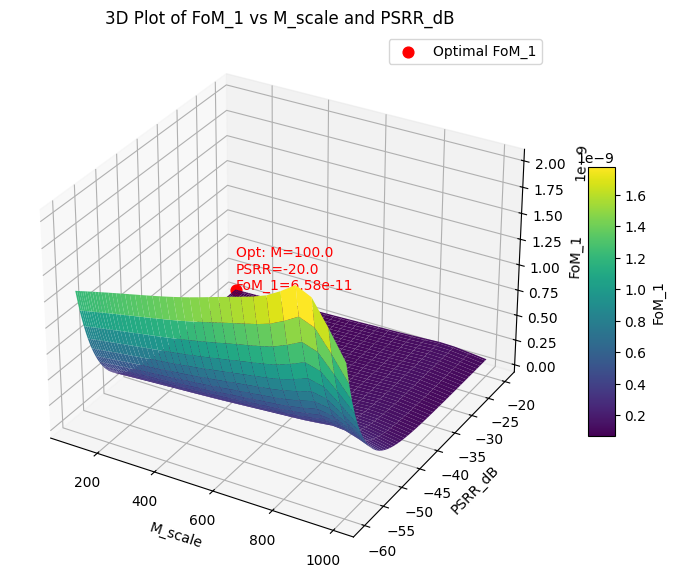

In [71]:
from mpl_toolkits.mplot3d import Axes3D
from plotly.offline import iplot

# Prepare meshgrid for M_scale and PSRR_dB_range
Mscale_vals = M_scale.values
PSRR_vals = PSRR_dB_range
M_grid, PSRR_grid = np.meshgrid(Mscale_vals, PSRR_vals)

# Calculate FoM for each combination
FoM1_grid = np.zeros_like(M_grid)
for i, psrr_db in enumerate(PSRR_vals):
    for j, m in enumerate(Mscale_vals):
        kgm = np.interp(m, M_scale, kgm_p)
        kcsg = np.interp(m, M_scale, kcsg_p)
        kcgd = np.interp(m, M_scale, kcgd_p)
        kgds = np.interp(m, M_scale, kgds_p)
        beta_val = I_load / (I_load + I_res_div)
        # Estimate I_1 and I_2 for each (psrr_db, m) using the function
        result = estimate_ldo_power_and_pass_params(
            PSRR_target_dB=psrr_db,
            f_bw=f_bw,
            PM_target=PM_target,
            I_load=I_load,
            I_res_div=I_res_div,
            V_out=V_out,
            V_ctrl=V_ctrl,
            C_out=C_L,
            csv_file_nmos=csv_file_nmos,
            csv_file_pmos=csv_file_pmos,
            kgm_target=kgm
        )
        I_1 = result['I_req1']
        I_2 = result['I_req2']

        FOM_1 = (1 / beta_val) * (1 + I_1 / I_2) * (
            kcsg / kgm + kcgd / kgm + kcgd / kgds
        )

        FoM1_grid[i, j] = FOM_1

# Plotting
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(M_grid, PSRR_grid, FoM1_grid, cmap='viridis', edgecolor='none')
ax.set_xlabel('M_scale')
ax.set_ylabel('PSRR_dB')
ax.set_zlabel('FoM_1')
ax.set_title('3D Plot of FoM_1 vs M_scale and PSRR_dB')
fig.colorbar(surf, shrink=0.5, aspect=10, label='FoM_1')

# Find and annotate the optimal (minimum) FoM_1 point
min_idx = np.unravel_index(np.argmin(FoM1_grid), FoM1_grid.shape)
opt_M = M_grid[min_idx]
opt_PSRR = PSRR_grid[min_idx]
opt_FoM1 = FoM1_grid[min_idx]
ax.scatter(opt_M, opt_PSRR, opt_FoM1, color='red', s=60, label='Optimal FoM_1')
ax.text(opt_M, opt_PSRR, opt_FoM1, f'Opt: M={opt_M:.1f}\nPSRR={opt_PSRR:.1f}\nFoM_1={opt_FoM1:.2e}', color='red')

plt.legend()
plt.show()

import plotly.graph_objs as go

# Prepare data for plotly
trace1 = go.Surface(
    x=M_scale,
    y=PSRR_vals,
    z=FoM1_grid,
    colorscale='Viridis',
    colorbar=dict(title='FoM_1')
)

# Mark the optimal point
opt_point1 = go.Scatter3d(
    x=[opt_M],
    y=[opt_PSRR],
    z=[opt_FoM1],
    mode='markers+text',
    marker=dict(size=6, color='red'),
    text=[f'Opt: M={opt_M:.1f}<br>PSRR={opt_PSRR:.1f}<br>FoM_1={opt_FoM1:.2e}'],
    textposition='top center'
)

layout1 = go.Layout(
    title='Interactive 3D Plot of FoM_1 vs M_scale and PSRR_dB',
    scene=dict(
        xaxis=dict(title='M_scale'),
        yaxis=dict(title='PSRR_dB'),
        zaxis=dict(title='FoM_1'),
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig_plotly1 = go.Figure(data=[trace1, opt_point1], layout=layout1)
iplot(fig_plotly1)

## FoM combination

Resistor Divider Resistance (R_res_div) for 1% current overhead at I_max: 12000.00 Ohms
Total current through the PMOS pass transistor (I_total): 10.10 mA
Gate-Drain Capacitance (Cgd) at I_total 10.10 mA: 0.390 pF
Gate-Source Capacitance (Cgs) at I_total 10.10 mA: 0.958 pF
Effective Load Resistance (R_L_eff) considering Rds: 287.09 Ohms
Effective Load Capacitance at I_min: 100.406 pF
Load Resistance (R_L) required for bandwidth target 1000000.0 Hz: 1585.12 Ohms
Using Resistor Divider Resistance (R_res_div): 12000.00 Ohms
Av_pass at I_total 10.10 mA: 24.53 V/V
Stage 2 required current (I_req_stage2): 39.9228 mA
Stage 2 input capacitance (C_in_stage2): 7.81 pF
Stage 1 required current (I_req_stage1): 761.7659 mA
Total required current (I_req_total): 801.6886 mA
Resistor Divider Resistance (R_res_div) for 1% current overhead at I_max: 12000.00 Ohms
Total current through the PMOS pass transistor (I_total): 10.10 mA
Gate-Drain Capacitance (Cgd) at I_total 10.10 mA: 0.390 pF
Gate-Source Capa

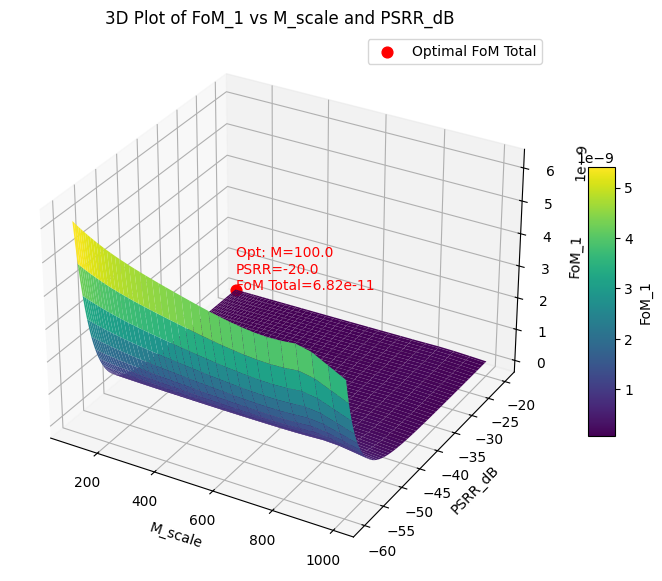

In [72]:
from mpl_toolkits.mplot3d import Axes3D
from plotly.offline import iplot

# Prepare meshgrid for M_scale and PSRR_dB_range
Mscale_vals = M_scale.values
PSRR_vals = PSRR_dB_range
M_grid, PSRR_grid = np.meshgrid(Mscale_vals, PSRR_vals)

# Calculate FoM for each combination
FoM1_grid = np.zeros_like(M_grid)
for i, psrr_db in enumerate(PSRR_vals):
    for j, m in enumerate(Mscale_vals):
        kgm = np.interp(m, M_scale, kgm_p)
        kcsg = np.interp(m, M_scale, kcsg_p)
        kcgd = np.interp(m, M_scale, kcgd_p)
        kgds = np.interp(m, M_scale, kgds_p)
        beta_val = I_load / (I_load + I_res_div)
        # Estimate I_1 and I_2 for each (psrr_db, m) using the function
        result = estimate_ldo_power_and_pass_params(
            PSRR_target_dB=psrr_db,
            f_bw=f_bw,
            PM_target=PM_target,
            I_load=I_load,
            I_res_div=I_res_div,
            V_out=V_out,
            V_ctrl=V_ctrl,
            C_out=C_L,
            csv_file_nmos=csv_file_nmos,
            csv_file_pmos=csv_file_pmos,
            kgm_target=kgm
        )
        I_1 = result['I_req1']
        I_2 = result['I_req2']

        FOM_1 = (1 / beta_val) * (1 + I_1 / I_2) * (
            kcsg / kgm + kcgd / kgm + kcgd / kgds
        )

        I_q_val = result['I_total']
        fom_val = (
            psrr_linear *
            ((C_L / I_load) / kgm_val + (kcsg_val / kgm_val) * ((beta_val + 1) / beta_val)) *
            (beta_val / (beta_val + 1)) *
            (I_q_val / I_load)
        )

        FoM1_grid[i, j] = FOM_1 + fom_val

# Plotting
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(M_grid, PSRR_grid, FoM1_grid, cmap='viridis', edgecolor='none')
ax.set_xlabel('M_scale')
ax.set_ylabel('PSRR_dB')
ax.set_zlabel('FoM_1')
ax.set_title('3D Plot of FoM_1 vs M_scale and PSRR_dB')
fig.colorbar(surf, shrink=0.5, aspect=10, label='FoM_1')

# Find and annotate the optimal (minimum) FoM_1 point
min_idx = np.unravel_index(np.argmin(FoM1_grid), FoM1_grid.shape)
opt_M = M_grid[min_idx]
opt_PSRR = PSRR_grid[min_idx]
opt_FoM_total = FoM1_grid[min_idx]
ax.scatter(opt_M, opt_PSRR, opt_FoM_total, color='red', s=60, label='Optimal FoM Total')
ax.text(opt_M, opt_PSRR, opt_FoM_total, f'Opt: M={opt_M:.1f}\nPSRR={opt_PSRR:.1f}\nFoM Total={opt_FoM_total:.2e}', color='red')

plt.legend()
plt.show()

import plotly.graph_objs as go

# Prepare data for plotly
trace1 = go.Surface(
    x=M_scale,
    y=PSRR_vals,
    z=FoM1_grid,
    colorscale='Viridis',
    colorbar=dict(title='FoM_1')
)

# Mark the optimal point
opt_point1 = go.Scatter3d(
    x=[opt_M],
    y=[opt_PSRR],
    z=[opt_FoM1],
    mode='markers+text',
    marker=dict(size=6, color='red'),
    text=[f'Opt: M={opt_M:.1f}<br>PSRR={opt_PSRR:.1f}<br>FoM_1={opt_FoM1:.2e}'],
    textposition='top center'
)

layout1 = go.Layout(
    title='Interactive 3D Plot of FoM_1 vs M_scale and PSRR_dB',
    scene=dict(
        xaxis=dict(title='M_scale'),
        yaxis=dict(title='PSRR_dB'),
        zaxis=dict(title='FoM_1'),
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig_plotly1 = go.Figure(data=[trace1, opt_point1], layout=layout1)
iplot(fig_plotly1)

## Undershoot Analysis

Resistor Divider Resistance (R_res_div) for 1% current overhead at I_max: 12000.00 Ohms
Total current through the PMOS pass transistor (I_total): 10.10 mA
Gate-Drain Capacitance (Cgd) at I_total 10.10 mA: 0.390 pF
Gate-Source Capacitance (Cgs) at I_total 10.10 mA: 0.958 pF
Effective Load Resistance (R_L_eff) considering Rds: 287.09 Ohms
Effective Load Capacitance at I_min: 100.406 pF
Load Resistance (R_L) required for bandwidth target 1000000.0 Hz: 1585.12 Ohms
Using Resistor Divider Resistance (R_res_div): 12000.00 Ohms
Av_pass at I_total 10.10 mA: 24.53 V/V
Stage 2 required current (I_req_stage2): 39.9228 mA
Stage 2 input capacitance (C_in_stage2): 7.81 pF
Stage 1 required current (I_req_stage1): 761.7659 mA
Total required current (I_req_total): 801.6886 mA
Resistor Divider Resistance (R_res_div) for 1% current overhead at I_max: 12000.00 Ohms
Total current through the PMOS pass transistor (I_total): 10.10 mA
Gate-Drain Capacitance (Cgd) at I_total 10.10 mA: 0.390 pF
Gate-Source Capa

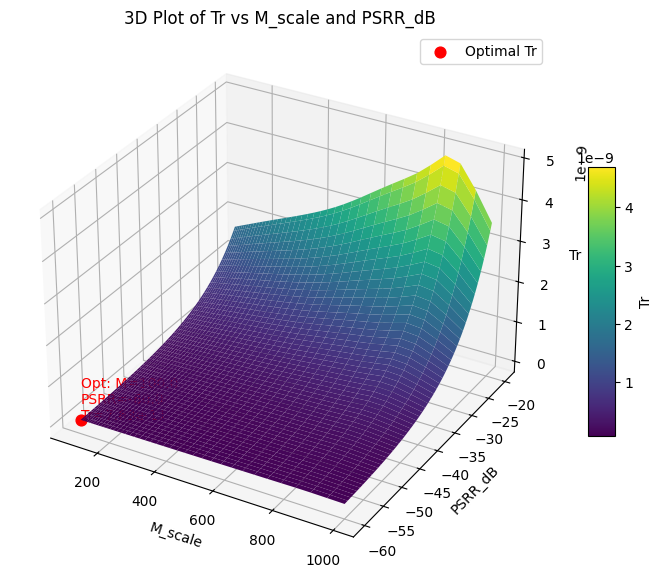

In [73]:
from mpl_toolkits.mplot3d import Axes3D
from plotly.offline import iplot

# Prepare meshgrid for M_scale and PSRR_dB_range
Mscale_vals = M_scale.values
PSRR_vals = PSRR_dB_range
M_grid, PSRR_grid = np.meshgrid(Mscale_vals, PSRR_vals)

# Calculate Tr for each combination
Tr_grid = np.zeros_like(M_grid)
for i, psrr_db in enumerate(PSRR_vals):
    for j, m in enumerate(Mscale_vals):
        kgm = np.interp(m, M_scale, kgm_p)
        kcsg = np.interp(m, M_scale, kcsg_p)
        kcgd = np.interp(m, M_scale, kcgd_p)
        kgds = np.interp(m, M_scale, kgds_p)
        beta_val = I_load / (I_load + I_res_div)
        # Estimate I_1 and I_2 for each (psrr_db, m) using the function
        result = estimate_ldo_power_and_pass_params(
            PSRR_target_dB=psrr_db,
            f_bw=f_bw,
            PM_target=PM_target,
            I_load=I_load,
            I_res_div=I_res_div,
            V_out=V_out,
            V_ctrl=V_ctrl,
            C_out=C_L,
            csv_file_nmos=csv_file_nmos,
            csv_file_pmos=csv_file_pmos,
            kgm_target=kgm
        )
        I_1 = result['I_req1']
        I_2 = result['I_req2']

        FOM_1 = (1 / beta_val) * (1 + I_1 / I_2) * (
            kcsg / kgm + kcgd / kgm + kcgd / kgds
        )

        I_q_val = result['I_total']
        fom_val = (
            psrr_linear *
            ((C_L / I_load) / kgm_val + (kcsg_val / kgm_val) * ((beta_val + 1) / beta_val)) *
            (beta_val / (beta_val + 1)) *
            (I_q_val / I_load)
        )

        Tr_grid[i, j] = (FOM_1 + fom_val)*(I_load/I_q_val)

# Plotting
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(M_grid, PSRR_grid, Tr_grid, cmap='viridis', edgecolor='none')
ax.set_xlabel('M_scale')
ax.set_ylabel('PSRR_dB')
ax.set_zlabel('Tr')
ax.set_title('3D Plot of Tr vs M_scale and PSRR_dB')
fig.colorbar(surf, shrink=0.5, aspect=10, label='Tr')

# Find and annotate the optimal (minimum) Tr point
min_idx = np.unravel_index(np.argmin(Tr_grid), Tr_grid.shape)
opt_M = M_grid[min_idx]
opt_PSRR = PSRR_grid[min_idx]
opt_Tr = Tr_grid[min_idx]
ax.scatter(opt_M, opt_PSRR, opt_Tr, color='red', s=60, label='Optimal Tr')
ax.text(opt_M, opt_PSRR, opt_Tr, f'Opt: M={opt_M:.1f}\nPSRR={opt_PSRR:.1f}\nTr={opt_Tr:.2e}', color='red')

plt.legend()
plt.show()

import plotly.graph_objs as go

# Prepare data for plotly
trace1 = go.Surface(
    x=M_scale,
    y=PSRR_vals,
    z=Tr_grid,
    colorscale='Viridis',
    colorbar=dict(title='Tr')
)

# Mark the optimal point
opt_point1 = go.Scatter3d(
    x=[opt_M],
    y=[opt_PSRR],
    z=[opt_Tr],
    mode='markers+text',
    marker=dict(size=6, color='red'),
    text=[f'Opt: M={opt_M:.1f}<br>PSRR={opt_PSRR:.1f}<br>Tr={opt_Tr:.2e}'],
    textposition='top center'
)

layout1 = go.Layout(
    title='Interactive 3D Plot of Tr vs M_scale and PSRR_dB',
    scene=dict(
        xaxis=dict(title='M_scale'),
        yaxis=dict(title='PSRR_dB'),
        zaxis=dict(title='Tr'),
    ),
    margin=dict(l=0, r=0, b=0, t=40)
)

fig_plotly1 = go.Figure(data=[trace1, opt_point1], layout=layout1)
iplot(fig_plotly1)